# Introduction

Data Set Information:

A Vicon motion capture camera system was used to record 12 users performing 5 hand postures with markers attached to a left-handed glove. The purpose of this project is to explore the data and see if we can use clustering efforts to classify distinguishable hand postures.

![Hand Position Targets](https://i.imgur.com/vkkOrbX.png)
![Glove Target Labels](https://i.imgur.com/7aQ4rx0.png)
![Hand Positions](https://i.imgur.com/ERkIgSJ.png)

The glove used to capture data

1.   Fist (with thumb out)
2.   Stop (hand flat)
3.   Point (with 1 finger)
4.   Point (with 2 fingers)
5.   Grab (fingers curled as if to grab)

The dataset and more information about the dataset can be found [here](http://archive.ics.uci.edu/ml/datasets/Motion+Capture+Hand+Postures#). In addition [here](http://www2.latech.edu/~jkanno/datadescription-1.pdf) is a link to a paper that describes the collection, features, and organization of this dataset.

# Exploratory Data Analysis (EDA)

## Load Data

In [7]:
#  Set Up Environment
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import mean
import time

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, MiniBatchKMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.datasets import fetch_openml

In [8]:
# Load the dataset
df = pd.read_csv('D:\\Thinkful Data Science\\Data Sets\\UCI ML - Hand Postures\\postures.csv')
df.head()

,Class,User,X0,Y0,Z0,X1,Y1,Z1,X2,Y2,...,Z8,X9,Y9,Z9,X10,Y10,Z10,X11,Y11,Z11
0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
1,1,0,54.263880,71.466776,-64.807709,76.895635,42.462500,-72.780545,36.621229,81.680557,...,?,?,?,?,?,?,?,?,?,?
2,1,0,56.527558,72.266609,-61.935252,39.135978,82.538530,-49.596509,79.223743,43.254091,...,?,?,?,?,?,?,?,?,?,?
3,1,0,55.849928,72.469064,-62.562788,37.988804,82.631347,-50.606259,78.451526,43.567403,...,?,?,?,?,?,?,?,?,?,?
4,1,0,55.329647,71.707275,-63.688956,36.561863,81.868749,-52.752784,86.320630,68.214645,...,?,?,?,?,?,?,?,?,?,?


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 78096 entries, 0 to 78095
Data columns (total 38 columns):
Class    78096 non-null int64
User     78096 non-null int64
X0       78096 non-null float64
Y0       78096 non-null float64
Z0       78096 non-null float64
X1       78096 non-null float64
Y1       78096 non-null float64
Z1       78096 non-null float64
X2       78096 non-null float64
Y2       78096 non-null float64
Z2       78096 non-null float64
X3       78096 non-null object
Y3       78096 non-null object
Z3       78096 non-null object
X4       78096 non-null object
Y4       78096 non-null object
Z4       78096 non-null object
X5       78096 non-null object
Y5       78096 non-null object
Z5       78096 non-null object
X6       78096 non-null object
Y6       78096 non-null object
Z6       78096 non-null object
X7       78096 non-null object
Y7       78096 non-null object
Z7       78096 non-null object
X8       78096 non-null object
Y8       78096 non-null object
Z8       78096 n

X1, Y1, Z1, etc all correspond to the X, Y, Z coordinates of its respective target number  (shown in the glove image in the intro). We also notice that the first entry has no data, so we will remove the first row from the dataset.

In [10]:
df=df[1:]
df.head()

,Class,User,X0,Y0,Z0,X1,Y1,Z1,X2,Y2,...,Z8,X9,Y9,Z9,X10,Y10,Z10,X11,Y11,Z11
1,1,0,54.263880,71.466776,-64.807709,76.895635,42.462500,-72.780545,36.621229,81.680557,...,?,?,?,?,?,?,?,?,?,?
2,1,0,56.527558,72.266609,-61.935252,39.135978,82.538530,-49.596509,79.223743,43.254091,...,?,?,?,?,?,?,?,?,?,?
3,1,0,55.849928,72.469064,-62.562788,37.988804,82.631347,-50.606259,78.451526,43.567403,...,?,?,?,?,?,?,?,?,?,?
4,1,0,55.329647,71.707275,-63.688956,36.561863,81.868749,-52.752784,86.320630,68.214645,...,?,?,?,?,?,?,?,?,?,?
5,1,0,55.142401,71.435607,-64.177303,36.175818,81.556874,-53.475747,76.986143,42.426849,...,?,?,?,?,?,?,?,?,?,?


## Create copy of dataframe to work with

In [11]:
df_copy = df
df_copy_2 = df

I'll take two approaches. One will be exploring the data by replacing '?' with null values, and one where I replace '?' with 0's

In [12]:
df_copy = df_copy.replace('?', np.nan)
df_copy_2 = df_copy_2.replace('?', 0)

Let's look at how many values in the data originally had '?'

In [13]:
# Counting null values
null_count = df_copy.isnull().sum()
null_count[null_count>0]

X3       690
Y3       690
Z3       690
X4      3120
Y4      3120
Z4      3120
X5     13023
Y5     13023
Z5     13023
X6     25848
Y6     25848
Z6     25848
X7     39152
Y7     39152
Z7     39152
X8     47532
Y8     47532
Z8     47532
X9     54128
Y9     54128
Z9     54128
X10    63343
Y10    63343
Z10    63343
X11    78064
Y11    78064
Z11    78064
dtype: int64

Since there is so much missing data, simply dropping null values would leave us with 32 rows out of ~78k. Since we lose too much of the data, I'll start by creating catered dataframes to see if any of these cluster better.


1.   df_4 through df_9 I'll use to drop columns that have a large number of missing data and remove null values in the leftover columns.
2.   Based on the hand postures I'll also create 4 dataframes that I catered to more specific scenaraions. For examaple, df_nothumb removes targets 9, 10, & 11 while df_selected only includes targets that should be shown most of the time.

In [14]:
# This set of new dataframes will use '?' converted to null
df_4 = df_copy.drop(['X4', 'Y4', 'Z4', 'X5', 'Y5', 'Z5', 'X6', 'Y6', 'Z6', 'X7', 'Y7', 'Z7', 'X8', 'Y8', 'Z8', 'X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)
df_5 = df_copy.drop(['X5', 'Y5', 'Z5', 'X6', 'Y6', 'Z6', 'X7', 'Y7', 'Z7', 'X8', 'Y8', 'Z8', 'X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)
df_6 = df_copy.drop(['X6', 'Y6', 'Z6', 'X7', 'Y7', 'Z7', 'X8', 'Y8', 'Z8', 'X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)
df_7 = df_copy.drop(['X7', 'Y7', 'Z7', 'X8', 'Y8', 'Z8', 'X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)
df_8 = df_copy.drop(['X8', 'Y8', 'Z8', 'X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)
df_9 = df_copy.drop(['X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)

# This set of new dataframes will use '?' converted to 0's
df_nothumbnail = df_copy_2.drop(['X11', 'Y11', 'Z11'], axis=1)
df_nothumb = df_copy_2.drop(['X9', 'Y9', 'Z9', 'X10', 'Y10', 'Z10', 'X11', 'Y11', 'Z11'], axis=1)
df_noknuckle = df_copy_2.drop(['X1', 'Y1', 'Z1', 'X3', 'Y3', 'Z3', 'X5', 'Y5', 'Z5', 'X7', 'Y7', 'Z7'], axis=1)
df_selected = df_copy_2[['Class', 'User', 'X2', 'Y2', 'Z2', 'X4', 'Y4', 'Z4', 'X5', 'Y5', 'Z5', 'X6', 'Y6', 'Z6', 'X7', 'Y7', 'Z7', 'X8', 'Y8', 'Z8']]

For df_4 through df_9 I'll also remove the null values

In [15]:
# Remove null values
df_4.dropna(inplace=True)
df_5.dropna(inplace=True)
df_6.dropna(inplace=True)
df_7.dropna(inplace=True)
df_8.dropna(inplace=True)
df_9.dropna(inplace=True)

In this section I'm setting the name of the dataframe - which I will use later as the title for it's respective plots

In [16]:
df_copy.name = 'df_copy'
df_4.name = 'df_4'
df_5.name = 'df_5'
df_6.name = 'df_6'
df_7.name = 'df_7'
df_8.name = 'df_8'
df_9.name = 'df_9'
df_copy_2.name = 'df_copy_2'
df_nothumbnail.name = 'df_nothumbnail'
df_nothumb.name = 'df_nothumb'
df_noknuckle.name = 'df_noknuckle'
df_selected.name = 'df_selected'

# Defining Functions

Since there is a lot of data, and many combinations of dataframes I created functions for each clustering method and each dimensionality reduction/plotting method. This will speed up testing and iterations.

## Target - Feature - Scalar Function
Function to set targets, features and apply Standard Scalar

In [5]:
# Function to take dataframe (df) and create the target variable (y), feature variables (X1, Y1, Z1, etc) and scaled data of feature variables (X_std)
# Stores X, y, X_std, and name as global variables (which can then be used for plotting and clustering purposes)
def target_feature_scalar(df):

  # Define global variables
  global X, y, X_std, name

  # Set Target Variable (Class) to Y and the feature variables to X
  X = df.drop(['Class', 'User'], axis=1)
  #X = df.drop(['Class'], axis=1)
  y = df['Class']

  # Standarizing the features
  scaler = StandardScaler()
  X_std = scaler.fit_transform(X)

  name = df.name
  return X_std

## Clustering Functions

### K-Means Clustering Function
Function to define and fit K-Means

In [12]:
# Define Function to create K-means cluster with inputs: n_clusters (n), and dataframe used (df)
# stores y_pred and kmeans_cluster as global variables, and prints out a cross tabulation of predicted cluster grouping vs original labels
def kmeans_function(n, df):
  
  # Create global variables
  global kmeans_cluster, y_pred
  
  # Defining the k-means
  kmeans_cluster = KMeans(n_clusters=n, random_state=123)

  # Fit model
  %timeit kmeans_cluster.fit(X_std)
  y_pred = kmeans_cluster.predict(X_std)

  # Add a column to the dataframe so we can compare clusters to original classes
  df['Cluster Predictions'] = y_pred
  print ('Comparison of predictions using {} clusters vs original labeled class'.format(n))
  print (pd.crosstab(df['Cluster Predictions'], df['Class']), '\n')

### Mini-Batch K-Means Function
Function to define and fit mini-batch k-means

In [13]:
# Define Function to create Mini-Batch K-means cluster with inputs: n_clusters (n), and dataframe used (df)
# stores y_pred and minikmeans_cluster as global variables, and prints out a cross tabulation of predicted cluster grouping vs original labels
def minikmeans_function(n, df):
  
  # Create global variables
  global minikmeans_cluster, y_pred

  # Defining the mini-batch k-means
  minikmeans_cluster = MiniBatchKMeans(
    init='random',
    n_clusters=n,
    batch_size=50)

  # Fit model
  %timeit minikmeans_cluster.fit(X_std)
  y_pred = minikmeans_cluster.predict(X_std)

  # Add a column to the dataframe so we can compare clusters to original classes
  df['Cluster Predictions'] = y_pred

### Evaluating Clusters for K-means Function
Function for Evaluating Clusters for K-means

### Heirarchical Clustering  Function
Function for Heirarchical Clustering

In [14]:
# Define Function to create Agglomerative Clustering with inputs: n_clusters (n), and dataframe used (df)
# stores y_pred and agg_cluster as global variables
def agg_function(n, df):
  
  # Create global variables
  global agg_cluster, y_pred

  # Defining the agglomerative clustering
  agg_cluster = AgglomerativeClustering(linkage='complete', 
                                        #affinity='cosine',
                                        n_clusters=n)

  # Fit model
  %timeit agg_cluster.fit(X_std)
  y_pred = agg_cluster.fit_predict(X_std)

In [15]:
# Define Function to create dendrogram
def dendrogram_function():

  # Plotting the Dendrogram for visualization purposes
  plt.figure(figsize=(20,10))
  dendrogram(linkage(X_std, method='complete'))
  plt.show()

### DBSCAN Function
Function for DBSCAN

In [16]:
# Define a function to create DBScan clusters with inputs: eps (ep), min_samples (minsamples), and dataframe used (df)
# stores y_pred and dbscan_cluster as global variables
def dbscan_function(ep, minsamples, df):
  
  # Create global variables
  global dbscan_cluster, y_pred
  
  # Defining the DBSCAN clustering
  dbscan_cluster = DBSCAN(eps=ep, min_samples=minsamples, metric='euclidean')
  
  # Fit model
  % timeit dbscan_cluster.fit_predict(X_std)
  y_pred = dbscan_cluster.fit_predict(X_std)

### Gaussian Mixture Models (GMM) Function
Function for GMM

In [17]:
# Define Function to create GMM cluster with inputs: n_clusters (n), and dataframe used (df)
# stores y_pred and gmm_cluster as global variables
def gmm_function(n, df, maxiter, covariancetype, ninit):
  
  # Create global variables
  global gmm_cluster, y_pred
  
  # Defining the agglomerative clustering
  gmm_cluster = GaussianMixture(n_components=n, random_state=123, max_iter=maxiter, covariance_type=covariancetype, n_init=ninit)
  #max_iter default is 100
  #‘full’ (default), ‘tied’, ‘diag’, ‘spherical’
  # ninit default is 1

  # Fit model
  %timeit gmm_cluster.fit(X_std)
  y_pred = gmm_cluster.predict(X_std)

  # Add a column to the dataframe so we can compare clusters to original classes
  df['Cluster Predictions'] = y_pred

### ARI Score Function
Function to return the ARI score

In [18]:
# Define function to return ARI score based on original labels (y) and cluster predictions (predict)
def ari(predict):
  return metrics.adjusted_rand_score(y, predict)

### Silhouette Score Function
Function to return the Silhouette score, most useful in the absence of original labels.

In [19]:
# Define function to return ARI score based on original scaled data (X_std) and cluster predictions (predict)
def silhouette(predict):
  return metrics.silhouette_score(X_std, predict, metric='euclidean')

### Scores Table Function
Function to iterate through a range of cluster numbers and produce ARI and Silhouette scores for each. This will be used to help narrow down which dataframe could provide the best results to dive deeper into

In [20]:
# Define function to create a table of cluster numbers, ARI scores and Silhouette scores
# inputs are range start and end (clusters X through Y), dataframe used (df), and which model was used (kmeans, minikmeans, etc)
def scores_table(range_start, range_end, df, model):
  ari_scores = []
  silhouette_scores = []
  for i in range(range_start,range_end):
    model(i, df)
    ari_scores.append(ari(y_pred))
    silhouette_scores.append(silhouette(y_pred))

  metric_scores = pd.DataFrame()
  metric_scores['ARI Scores'] = ari_scores
  metric_scores['Silhouette Scores'] = silhouette_scores
  metric_scores.set_index(pd.Series(range(range_start,range_end),  name='Cluster Number'))

  print (metric_scores.set_index(pd.Series(range(range_start,range_end),  name='Cluster Number')))

  #return metric_scores.set_index(pd.Series(range(range_start,range_end),  name='Cluster Number'))

###  Cluster Comparison Function
Function to create a barplot that compares how many of the originally labeled values show up in each created cluster.

In [21]:
# Define function to create barplot given input of dataframe used (df)
# A clustering function has to be run prior to this as it will store/create a column that contains the cluster predictions it made
def cluster_comparison(df):
  # Barplot of clusters vs original classes
  df_graph = pd.crosstab(df['Cluster Predictions'], df['Class'])
  df_graph = df_graph.stack().reset_index().rename(columns={0: 'value'})
  sns.barplot(x=df_graph['Cluster Predictions'], y=df_graph.value, hue=df_graph.Class)

## Basic Graphing Function
Function to graph based on lecture method

### matplotlib Graphing Function

In [22]:
# Function to take drf(dimensionality reduction function), tar(target variable), and predict(y_pred_) 
# and return matplotlib of cluster predictions (numbers) against actual target values (colors)
def graph_function(drf, tar):

  # In order to plot the data we need to reduce dimensionality to 2 components.
  #pca = PCA(n_components=2).fit_transform(X_std)
  #tar = df_9['Class']

  plt.figure(figsize=(10,5))
  colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
  for i in range(drf.shape[0]):
      plt.text(drf[i, 0], drf[i, 1], str(y_pred[i]),
              color=colours[tar.iloc[i]],
              fontdict={'weight': 'bold', 'size': 20}
          )

  plt.xticks([])
  plt.yticks([])
  plt.axis('off')
  plt.show()

### SNS Plotting Function

In [23]:
# Function to take drf (dimensionality reduction function), tar (target variable), num_clusters (number of clusters)
# and return sns graph of cluster predictions against actual target values (colors)
def snsgraph_function(drf, num_clusters):

  # Create a dataframe for t-SNE results, which we will use to plot clustering below
  df_subset = pd.DataFrame()
  df_subset['First Component'] = drf[:,0]
  df_subset['Second Component'] = drf[:,1]

  plt.figure(figsize=(16,10))
  sns.scatterplot(
    x=str(df_subset.columns[0]), y=str(df_subset.columns[1]),
    hue=y,
    palette=sns.color_palette("deep", num_clusters),
    data=df_subset,
    legend="full",
    alpha=0.8)
  
  plt.title(name)

## Dimensionality Reduction Functions

### PCA Function
Function to perform PCA with n-components

In [24]:
# Function to perform PCA with n-components (n), X_std (d) 
# and dataframe name (name, created by target_feature_scalar function)
#def pca_function(n, d, clusters, name):
def pca_function(n, d):

  # Definte global variables
  global pca
  
  # We just want the first two principal components
  pca = PCA(n_components=n)

  # We get the components by calling fit_transform method with our data
  pca = pca.fit_transform(d)

  # Create a dataframe for t-SNE results, which we will use to plot clustering below
  df_subset = pd.DataFrame()
  df_subset['pca_one'] = pca[:,0]
  df_subset['pca_two'] = pca[:,1]

  return pca

### t-SNE Function
Function to perform t-SNE with n-components

In [25]:
# Function to perform t-SNE with n-components
# Default is verbose 1, perplexity 40, n-iter 300. We can add these to be function inputs later
def tsne_function(n, d, clusters, name, perp):

  # Definte global variables
  global tsne

  # We will generally use 2 components for visualization purposes
  tsne = TSNE(n_components=n, verbose=1, perplexity=perp, n_iter=300)
  tsne = tsne.fit_transform(d)

  # Create a dataframe for t-SNE results, which we will use to plot clustering below
  df_subset = pd.DataFrame()
  df_subset['tsne_one'] = tsne[:,0]
  df_subset['tsne_two'] = tsne[:,1]

  plt.figure(figsize=(16,10))
  sns.scatterplot(
    x="tsne_one", y="tsne_two",
    hue=y,
    palette=sns.color_palette("deep", clusters),
    data=df_subset,
    legend="full",
    alpha=0.8)
  
  plt.title(name)

  return tsne

### UMAP Function
Function to perform UMAP

In [3]:
# Function to perform UMAP
# Default is n-neighbors 5, min_dist 0.3, metric correlation. We can add these to be function inputs later
def umap_function(d, clusters, name, nneighbors, mindistance):

  # Definte global variables
  global umap

  # We will generally use 2 components for visualization purposes
  #umap = UMAP(n_neighbors=5, min_dist=0.3, metric='correlation')
  #umap = umap.fit_transform(d)

  umap = umap.UMAP(n_neighbors=nneighbors, min_dist=mindistance, metric='correlation').fit_transform(d)

  # Create a dataframe for umap results, which we will use to plot clustering below
  df_subset = pd.DataFrame()
  df_subset['umap_one'] = umap[:,0]
  df_subset['umap_two'] = umap[:,1]

  plt.figure(figsize=(16,10))
  sns.scatterplot(
    x="umap_one", y="umap_two",
    hue=y,
    palette=sns.color_palette("deep", clusters),
    data=df_subset,
    legend="full",
    alpha=0.8)
  
  plt.title(name)

  return umap

# Clustering

## ARI / Silhouette Scores
To start we will use minibatch K means function (since minibatch k-means tends to run quickly) to find the best performing dataframe. If there is one that provides the best ARI/Silhouette score, we will explore that dataframe in depth.

In [51]:
for i in [df_4, df_5, df_6, df_7, df_8, df_9, df_nothumbnail, df_nothumb, df_noknuckle, df_selected]:
  target_feature_scalar(i)
  scores_table(2, 10, i, minikmeans_function)
  print ('ARI and Silhouette Scores for ' + str(i.name) + '\n')

377 ms ± 68.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
660 ms ± 217 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
545 ms ± 157 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
583 ms ± 183 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
636 ms ± 220 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
645 ms ± 256 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
915 ms ± 228 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
944 ms ± 245 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
                ARI Scores  Silhouette Scores
Cluster Number                               
2                 0.122228           0.162542
3                 0.108831           0.158164
4                 0.114809           0.160750
5                 0.094770           0.142966
6                 0.103991           0.148326
7                 0.110907           0.155221
8                 0.092509           0.145008
9                 0.104306           0.149900
ARI

353 ms ± 8.71 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
446 ms ± 227 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
358 ms ± 25.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
367 ms ± 12.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
376 ms ± 28.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
372 ms ± 24.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
353 ms ± 10.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
396 ms ± 29.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
                ARI Scores  Silhouette Scores
Cluster Number                               
2                 0.249111           0.269161
3                 0.220739           0.238116
4                 0.223398           0.183646
5                 0.277202           0.107576
6                 0.286478           0.129471
7                 0.228629           0.102558
8                 0.231343           0.105071
9                 0.239640           0.1065

C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


425 ms ± 95.5 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


450 ms ± 140 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


595 ms ± 130 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


629 ms ± 286 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


488 ms ± 146 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


678 ms ± 233 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


921 ms ± 178 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


C:\Users\Mike\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


                ARI Scores  Silhouette Scores
Cluster Number                               
2                 0.277920           0.214272
3                 0.316739           0.147646
4                 0.319695           0.155763
5                 0.280460           0.129258
6                 0.229682           0.131029
7                 0.275120           0.134158
8                 0.209958           0.092119
9                 0.201999           0.137494
ARI and Silhouette Scores for df_selected



## The 'Elbow Method'
Based on the results above, we choose to continue with 'df_nothumb' as it provides the best ARI score. Going forward we need to determine the appropriate amount of clusters. The ARI score is a good indication but we can also explore the 'Elbow Method'. In this method we choose a point where we start to see diminishing returns.

In [28]:
wcss=[]

for i in range(1,10):
  minikmeans_function(i, df_nothumb)
  wcss_iter = minikmeans_cluster.inertia_
  wcss.append(wcss_iter)

358 ms ± 2.95 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
562 ms ± 183 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
512 ms ± 170 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
527 ms ± 147 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
618 ms ± 253 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
573 ms ± 182 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
550 ms ± 242 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
679 ms ± 234 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
508 ms ± 135 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


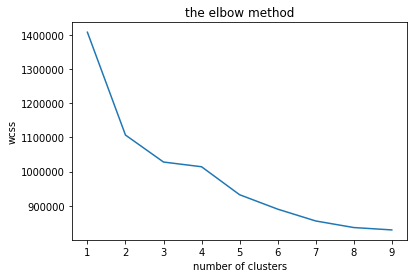

In [29]:
number_clusters = range(1,10)
plt.plot(number_clusters, wcss)
plt.title('the elbow method')
plt.xlabel('number of clusters')
plt.ylabel('wcss')
plt.show()

## Comparing Cluster Models
Based on the 'elbow' curve above and the ARI scores provided above, we notice that 5 clusters seems to be a good number of clusters to work with. We also have the knowledge that our data has 5 unique labels, so we already know that 5 should be appropriate to move forward with. Next we will compare ARI and Silhouette scores for a few cluster modeling functions to see which one provides the best results.

### K-Means

In [30]:
# K-Means
avg_ari_score = []
for i in range(5):
  target_feature_scalar(df_nothumb)
  kmeans_function(5, df_nothumb)
  avg_ari_score.append(ari(y_pred))

print ('Average ARI score for kmeans: {}'.format(mean(avg_ari_score)))

3.57 s ± 13.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Comparison of predictions using 5 clusters vs original labeled class
Class                   1      2     3     4      5
Cluster Predictions                                
0                    5467    136  4586  4750    684
1                     700    401  2352  6052    818
2                     264  10795   249   997   3282
3                       5   3493   883  2148  10729
4                    9829    153  8274   828    220 

3.97 s ± 7.44 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Comparison of predictions using 5 clusters vs original labeled class
Class                   1     2     3     4     5
Cluster Predictions                              
0                    6159   152  6029  9834  1044
1                    9089   124  7971   791   210
2                       0  1836   430  1253  9245
3                    1007  6250  1897  2101  1487
4                      10  6616    17   796  3747 

4.04 s ±

### Mini-Batch K-Means

In [31]:
# Mini-Batch K-Means
avg_ari_score = []
for i in range(5):
  target_feature_scalar(df_nothumb)
  minikmeans_function(5, df_nothumb)
  avg_ari_score.append(ari(y_pred))

print ('Average ARI score for minibatch k-means: {}'.format(mean(avg_ari_score)))

596 ms ± 249 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
768 ms ± 224 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
552 ms ± 239 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
677 ms ± 183 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
650 ms ± 190 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for minibatch k-means: 0.2677170397260639


### Gaussian Mixture Model (GMM)

In [33]:
# Gaussian Mixture Model
avg_ari_score = []
for i in range(5):
  target_feature_scalar(df_nothumb)
  gmm_function(5, df_nothumb, 100, 'full', 1)
  avg_ari_score.append(ari(y_pred))

print ('Average ARI score for GMM: {}'.format(mean(avg_ari_score)))

4.46 s ± 48 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
3.26 s ± 260 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
3.98 s ± 225 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
3.76 s ± 257 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
4.3 s ± 466 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM: 0.28548551911472925


#### GMM Optimization With Hyperparameters

In [35]:
# Gaussian Mixture Model
for i in ['full', 'tied', 'diag', 'spherical']:
  avg_ari_score = []
  for j in range(5):
    target_feature_scalar(df_nothumb)
    gmm_function(5, df_nothumb, 50, i, 1)
    avg_ari_score.append(ari(y_pred))

  print ('Average ARI score for GMM using {}: {}'.format(i, mean(avg_ari_score)))

3.63 s ± 5.72 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
3.1 s ± 13.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
4.15 s ± 9.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.66 s ± 9.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
5.7 s ± 10.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM using full: 0.3235348857299876
2.25 s ± 17.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
4.43 s ± 7.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.34 s ± 7.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.14 s ± 30 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.99 s ± 13.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM using tied: 0.29232054560671833
1.24 s ± 4.12 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
857 ms ± 3.65 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.07 s ± 2.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.08 s ± 1

In [36]:
# Gaussian Mixture Model
for i in [50, 100, 150, 200]:
  avg_ari_score = []
  for j in range(5):
    target_feature_scalar(df_nothumb)
    gmm_function(5, df_nothumb, i, 'full', 1)
    avg_ari_score.append(ari(y_pred))

  print ('Average ARI score for GMM using {}: {}'.format(i, mean(avg_ari_score)))

7.53 s ± 234 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
4.08 s ± 95 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.94 s ± 13.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.4 s ± 11.3 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.41 s ± 10.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM using 50: 0.3397412411563482
2.53 s ± 36.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.5 s ± 57.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.41 s ± 13.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.4 s ± 15.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.4 s ± 9.97 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM using 100: 0.3055184388770222
2.41 s ± 9.31 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.4 s ± 9.74 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.4 s ± 12.7 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.41 s ± 21.5 

In [37]:
# Gaussian Mixture Model
for i in [1, 2, 3, 4]:
  avg_ari_score = []
  for j in range(5):
    target_feature_scalar(df_nothumb)
    gmm_function(5, df_nothumb, 100, 'full', i)
    avg_ari_score.append(ari(y_pred))

  print ('Average ARI score for GMM using {} n_init: {}'.format(i, mean(avg_ari_score)))

2.41 s ± 4.93 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.41 s ± 7.59 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.4 s ± 7.39 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.41 s ± 11 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
2.45 s ± 98.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM using 1 n_init: 0.3055184388770222
5.6 s ± 3.45 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
5.6 s ± 5.61 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
5.62 s ± 16 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
5.61 s ± 14.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
5.6 s ± 14.1 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Average ARI score for GMM using 2 n_init: 0.3055184388770222
7.59 s ± 43 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
7.59 s ± 6.99 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
7.58 s ± 12.9 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
7.6 

Based on the scores above GMM function provides the best result. Now let's compare the clusters it assigned to the labeled values to see if there is any insight on how well it grouped data together.

In our optimization above we looked at modifying n_components, covariance_type, max_iter, and n_init.

The best performing combination is n_components=5, covariance_type='full', max_iter='100', and n_init did not seem to affect the performance. Best ARI average ARI score ends up being 0.445

## Comparing Cluster Predictions to Labeled Target Values

In [38]:
target_feature_scalar(df_nothumb)

array([[ 0.11981925, -0.35684664, -1.01341207, ..., -0.6815126 ,
         0.3765667 , -0.79019895],
       [ 0.18905405, -0.33695189, -0.92981748, ..., -0.6815126 ,
         0.3765667 , -0.79019895],
       [ 0.16832865, -0.33191609, -0.94808011, ..., -0.6815126 ,
         0.3765667 , -0.79019895],
       ...,
       [ 0.11638332,  1.08091801, -0.41290612, ...,  1.30399072,
         0.52805298,  0.74618972],
       [-0.68605392,  0.55205173,  1.18736828, ...,  0.53402111,
        -2.12016139, -0.02200462],
       [-0.68656181,  0.55417809,  1.19589227, ...,  0.53720551,
        -2.11245848, -0.02200462]])

3.96 s ± 7.87 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
Comparison of predictions using 5 clusters vs original labeled class
Class                    1     2     3     4     5
Cluster Predictions                               
0                      998   329  3806  4386  1528
1                    12818    99  9627   892   177
2                       12  6334    20   830  4013
3                       36  8149    47  1457  9454
4                     2401    67  2844  7210   561 



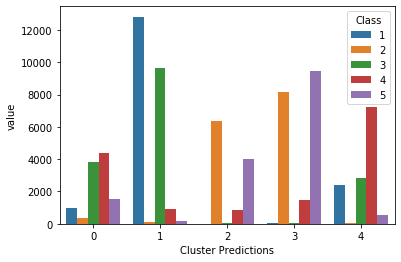

In [39]:
kmeans_function(5, df_nothumb)
cluster_comparison(df_nothumb)

651 ms ± 145 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


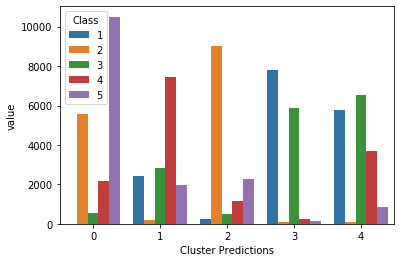

In [40]:
minikmeans_function(5, df_nothumb)
cluster_comparison(df_nothumb)

4.34 s ± 14.8 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


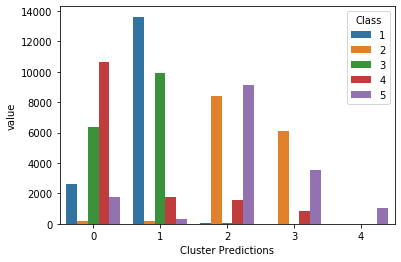

In [41]:
target_feature_scalar(df_nothumb)
gmm_function(5, df_nothumb, 100, 'full', 1)
cluster_comparison(df_nothumb)

## Visualizing & Dimensionality Reduction
Let's see how well we can visualize our results by using dimensionality reduction (PCA, t-SNE, and UMAP)

### PCA Visualization

In [42]:
pca_function(2, X_std)

array([[ 3.65541112,  0.05115834],
       [ 3.61159627,  0.36612691],
       [ 3.62102121,  0.35267352],
       ...,
       [-2.65259434, -1.11185445],
       [-3.22309049, -0.49171142],
       [-3.39104651, -0.30485334]])

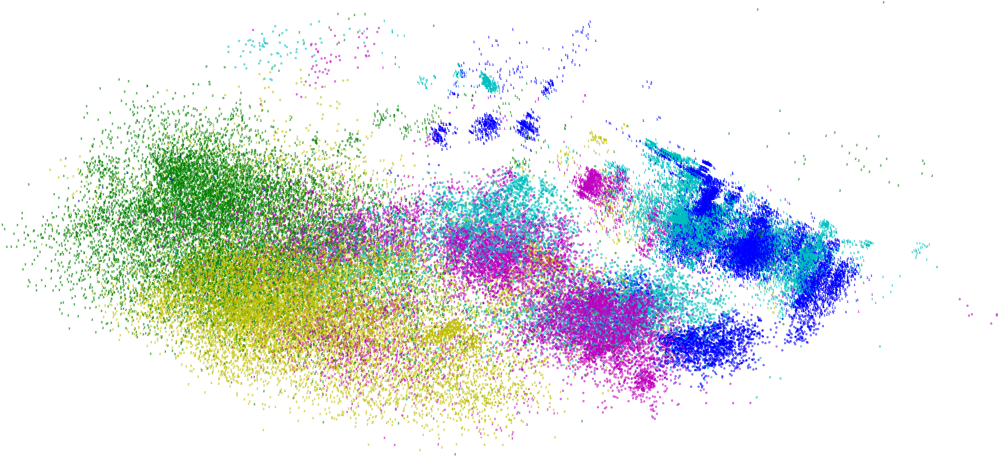

In [43]:
graph_function(pca, y)

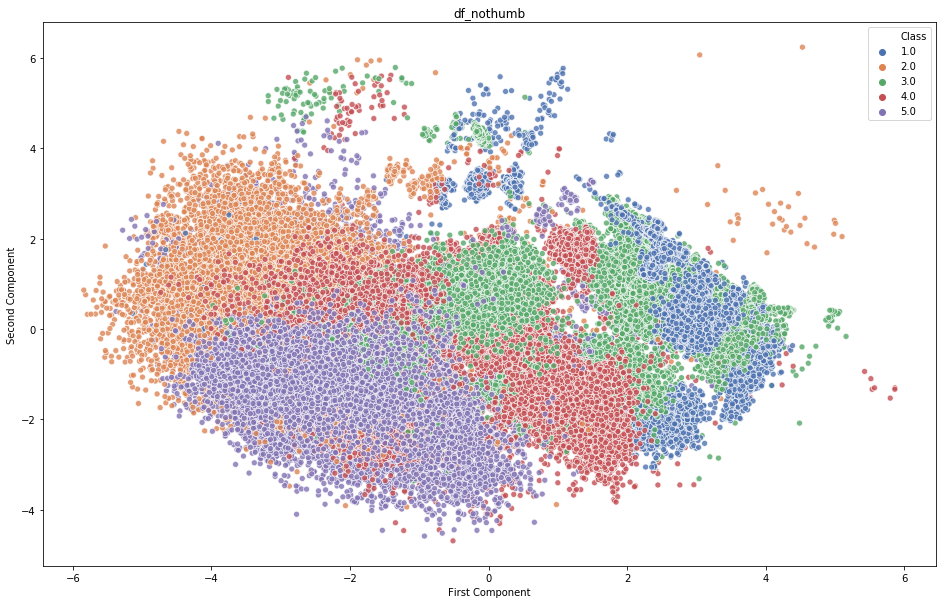

In [44]:
snsgraph_function(pca, 5)

### t-SNE Visualization

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 78095 samples in 3.676s...
[t-SNE] Computed neighbors for 78095 samples in 463.364s...
[t-SNE] Computed conditional probabilities for sample 1000 / 78095
[t-SNE] Computed conditional probabilities for sample 2000 / 78095
[t-SNE] Computed conditional probabilities for sample 3000 / 78095
[t-SNE] Computed conditional probabilities for sample 4000 / 78095
[t-SNE] Computed conditional probabilities for sample 5000 / 78095
[t-SNE] Computed conditional probabilities for sample 6000 / 78095
[t-SNE] Computed conditional probabilities for sample 7000 / 78095
[t-SNE] Computed conditional probabilities for sample 8000 / 78095
[t-SNE] Computed conditional probabilities for sample 9000 / 78095
[t-SNE] Computed conditional probabilities for sample 10000 / 78095
[t-SNE] Computed conditional probabilities for sample 11000 / 78095
[t-SNE] Computed conditional probabilities for sample 12000 / 78095
[t-SNE] Computed conditional probabilities for s

array([[-5.0744524, -4.14618  ],
       [-4.582166 , -3.4195635],
       [-4.5823007, -3.4205801],
       ...,
       [ 1.6310056,  3.4986486],
       [ 1.1889122,  1.4657011],
       [ 1.4212877,  1.4835451]], dtype=float32)

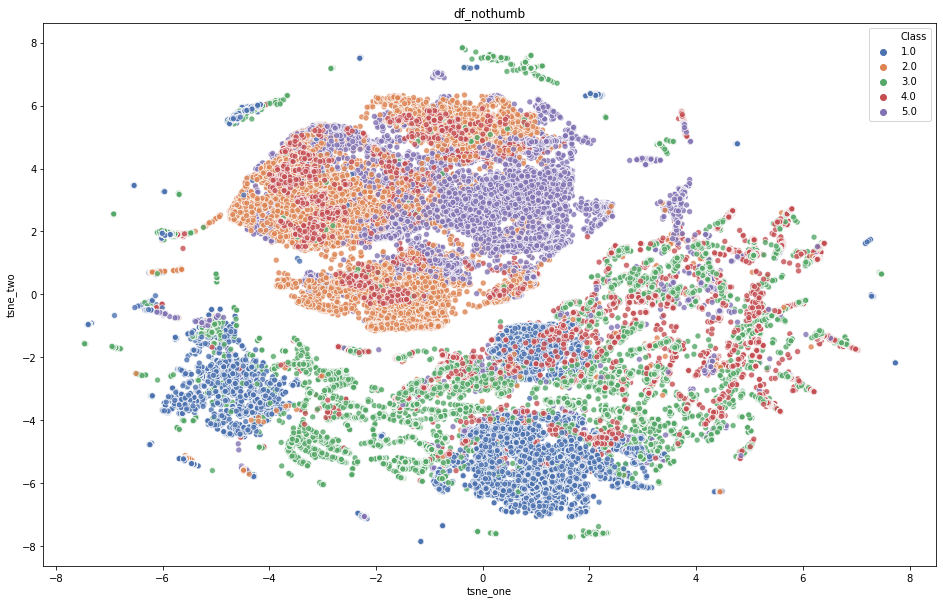

In [45]:
tsne_function(2, target_feature_scalar(df_nothumb), 5, name, 20)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 78095 samples in 4.191s...
[t-SNE] Computed neighbors for 78095 samples in 545.601s...
[t-SNE] Computed conditional probabilities for sample 1000 / 78095
[t-SNE] Computed conditional probabilities for sample 2000 / 78095
[t-SNE] Computed conditional probabilities for sample 3000 / 78095
[t-SNE] Computed conditional probabilities for sample 4000 / 78095
[t-SNE] Computed conditional probabilities for sample 5000 / 78095
[t-SNE] Computed conditional probabilities for sample 6000 / 78095
[t-SNE] Computed conditional probabilities for sample 7000 / 78095
[t-SNE] Computed conditional probabilities for sample 8000 / 78095
[t-SNE] Computed conditional probabilities for sample 9000 / 78095
[t-SNE] Computed conditional probabilities for sample 10000 / 78095
[t-SNE] Computed conditional probabilities for sample 11000 / 78095
[t-SNE] Computed conditional probabilities for sample 12000 / 78095
[t-SNE] Computed conditional probabilities for 

array([[ 5.8303285, -1.1390649],
       [ 5.803193 , -0.7243742],
       [ 5.8044157, -0.7232258],
       ...,
       [-3.5259156,  1.3672444],
       [-5.2044725,  1.4092642],
       [-5.250159 ,  1.515383 ]], dtype=float32)

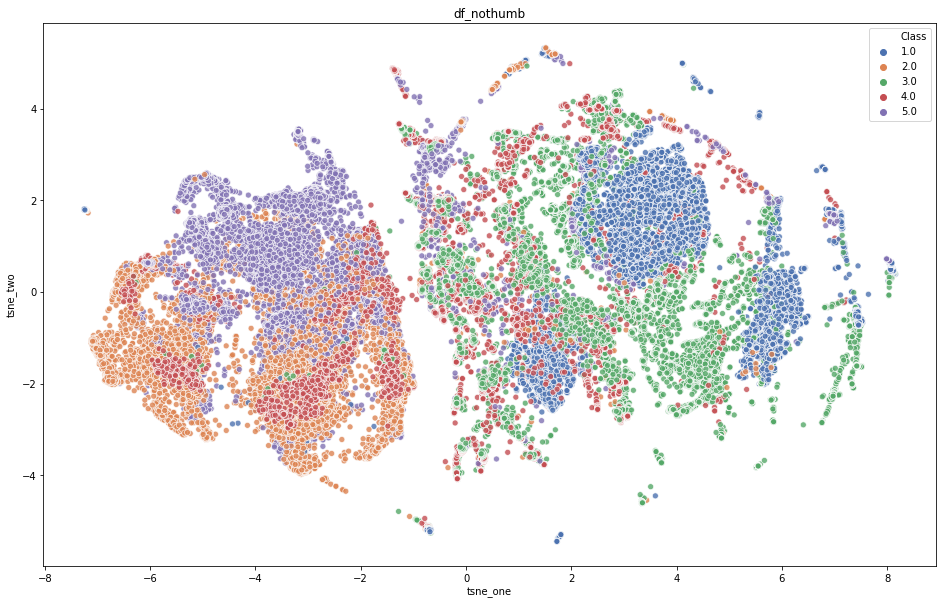

In [46]:
tsne_function(2, target_feature_scalar(df_nothumb), 5, name, 40)

[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 78095 samples in 4.029s...
[t-SNE] Computed neighbors for 78095 samples in 571.730s...
[t-SNE] Computed conditional probabilities for sample 1000 / 78095
[t-SNE] Computed conditional probabilities for sample 2000 / 78095
[t-SNE] Computed conditional probabilities for sample 3000 / 78095
[t-SNE] Computed conditional probabilities for sample 4000 / 78095
[t-SNE] Computed conditional probabilities for sample 5000 / 78095
[t-SNE] Computed conditional probabilities for sample 6000 / 78095
[t-SNE] Computed conditional probabilities for sample 7000 / 78095
[t-SNE] Computed conditional probabilities for sample 8000 / 78095
[t-SNE] Computed conditional probabilities for sample 9000 / 78095
[t-SNE] Computed conditional probabilities for sample 10000 / 78095
[t-SNE] Computed conditional probabilities for sample 11000 / 78095
[t-SNE] Computed conditional probabilities for sample 12000 / 78095
[t-SNE] Computed conditional probabilities for 

array([[ 4.237268 ,  2.0314345],
       [ 4.2493105,  1.8135761],
       [ 4.2523203,  1.814042 ],
       ...,
       [ 1.3337831, -1.3441256],
       [ 2.9911075, -1.7192588],
       [ 3.038796 , -1.7022363]], dtype=float32)

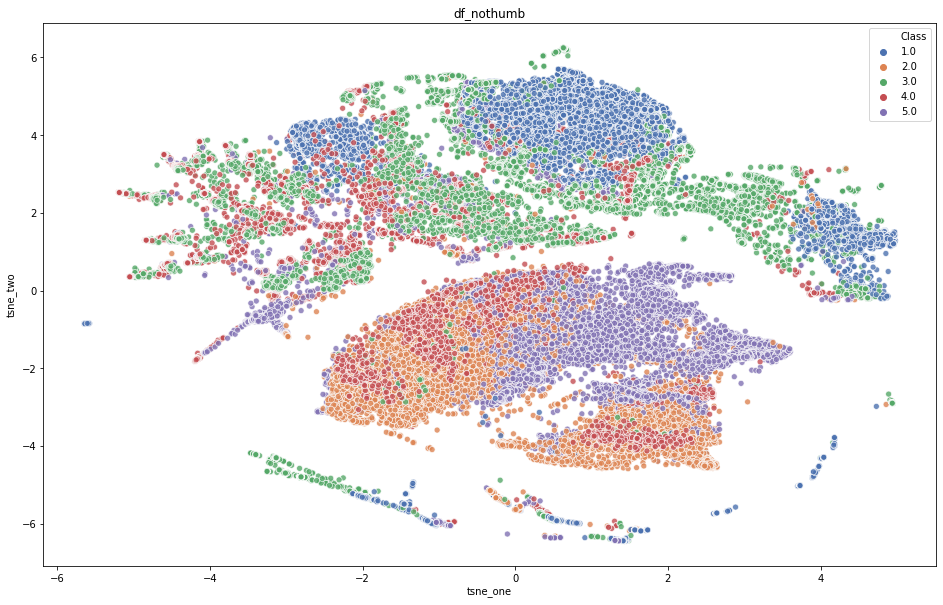

In [47]:
tsne_function(2, target_feature_scalar(df_nothumb), 5, name, 60)

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 78095 samples in 3.856s...
[t-SNE] Computed neighbors for 78095 samples in 582.089s...
[t-SNE] Computed conditional probabilities for sample 1000 / 78095
[t-SNE] Computed conditional probabilities for sample 2000 / 78095
[t-SNE] Computed conditional probabilities for sample 3000 / 78095
[t-SNE] Computed conditional probabilities for sample 4000 / 78095
[t-SNE] Computed conditional probabilities for sample 5000 / 78095
[t-SNE] Computed conditional probabilities for sample 6000 / 78095
[t-SNE] Computed conditional probabilities for sample 7000 / 78095
[t-SNE] Computed conditional probabilities for sample 8000 / 78095
[t-SNE] Computed conditional probabilities for sample 9000 / 78095
[t-SNE] Computed conditional probabilities for sample 10000 / 78095
[t-SNE] Computed conditional probabilities for sample 11000 / 78095
[t-SNE] Computed conditional probabilities for sample 12000 / 78095
[t-SNE] Computed conditional probabilities for 

array([[ 4.620345 ,  1.699374 ],
       [ 4.8394055,  1.7046828],
       [ 4.8413916,  1.7013699],
       ...,
       [-3.2429874, -2.1271105],
       [-3.9112222, -3.452099 ],
       [-3.949606 , -3.4592943]], dtype=float32)

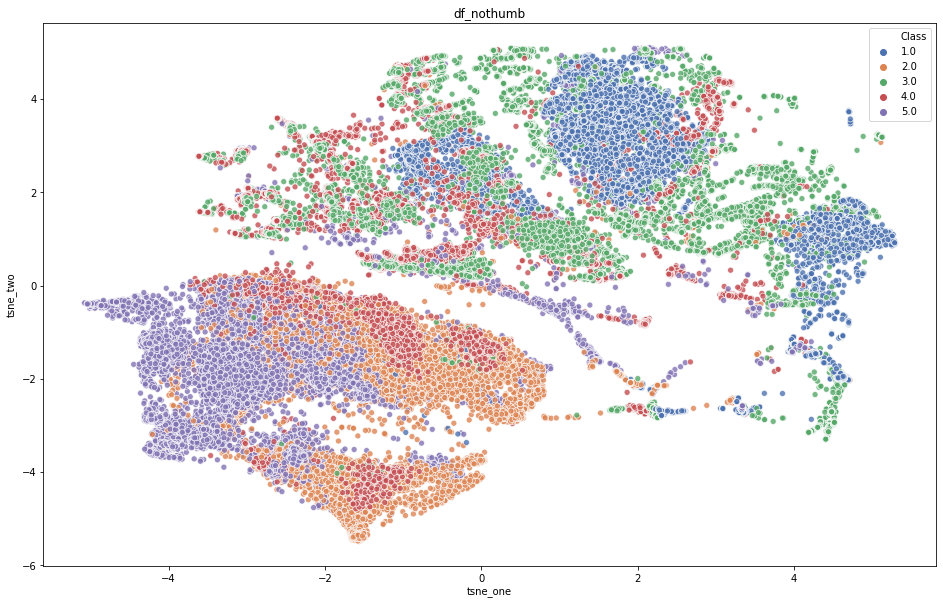

In [48]:
tsne_function(2, target_feature_scalar(df_nothumb), 5, name, 80)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 78095 samples in 3.695s...
[t-SNE] Computed neighbors for 78095 samples in 624.328s...
[t-SNE] Computed conditional probabilities for sample 1000 / 78095
[t-SNE] Computed conditional probabilities for sample 2000 / 78095
[t-SNE] Computed conditional probabilities for sample 3000 / 78095
[t-SNE] Computed conditional probabilities for sample 4000 / 78095
[t-SNE] Computed conditional probabilities for sample 5000 / 78095
[t-SNE] Computed conditional probabilities for sample 6000 / 78095
[t-SNE] Computed conditional probabilities for sample 7000 / 78095
[t-SNE] Computed conditional probabilities for sample 8000 / 78095
[t-SNE] Computed conditional probabilities for sample 9000 / 78095
[t-SNE] Computed conditional probabilities for sample 10000 / 78095
[t-SNE] Computed conditional probabilities for sample 11000 / 78095
[t-SNE] Computed conditional probabilities for sample 12000 / 78095
[t-SNE] Computed conditional probabilities for 

array([[ 3.029004 , -3.5285542],
       [ 3.395238 , -3.0554333],
       [ 3.3947222, -3.0626497],
       ...,
       [-1.4643488,  3.0231674],
       [-1.7660916,  4.439042 ],
       [-1.7961032,  4.451745 ]], dtype=float32)

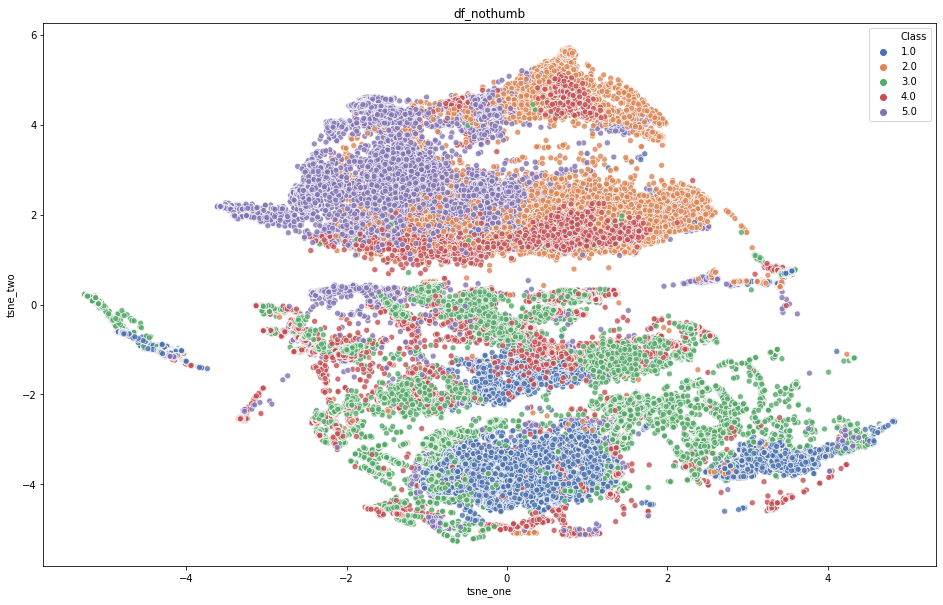

In [49]:
tsne_function(2, target_feature_scalar(df_nothumb), 5, name, 100)

### UMAP Visualization

In [17]:
target_feature_scalar(df_nothumb)

array([[ 0.11981925, -0.35684664, -1.01341207, ..., -0.55957287,
        -0.6815126 ,  0.3765667 ],
       [ 0.18905405, -0.33695189, -0.92981748, ..., -0.55957287,
        -0.6815126 ,  0.3765667 ],
       [ 0.16832865, -0.33191609, -0.94808011, ..., -0.55957287,
        -0.6815126 ,  0.3765667 ],
       ...,
       [ 0.11638332,  1.08091801, -0.41290612, ..., -0.61235039,
         1.30399072,  0.52805298],
       [-0.68605392,  0.55205173,  1.18736828, ...,  2.06420576,
         0.53402111, -2.12016139],
       [-0.68656181,  0.55417809,  1.19589227, ...,  2.06069827,
         0.53720551, -2.11245848]])

array([[-5.5758524 ,  0.42722517],
       [-1.0581479 ,  3.9196389 ],
       [-1.0732089 ,  3.8836694 ],
       ...,
       [10.773553  ,  9.467745  ],
       [ 9.80092   ,  8.338887  ],
       [ 9.707976  ,  8.13608   ]], dtype=float32)

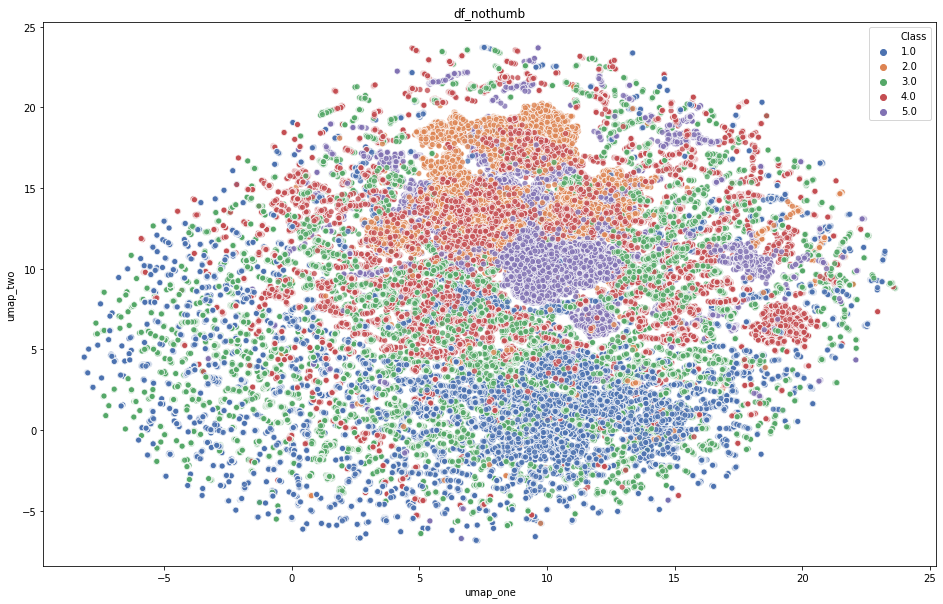

In [55]:
umap_function(target_feature_scalar(df_nothumb), 5, name, 5, 0.3)

# Conclusions

By creating many variations of our dataframe we were able to vet out which combinations clustered better. I found that simply dropping columns and null values did not provide good results, while selectively choosing which columns to run the models on (and keeping null values) seemed to offer the best clustering results.

## Clustering Model Conclusion

I also found that while k-means and mini-batch k-means provided similar results to GMM, GMM ultimately performed the best in terms of ARI and Silhouette scores. The metric I rely most on is ARI score since we know how the data was originally labeled. With parameter optimization we were able to improve ARI score for GMM to about 0.44 (which is a large jump from ~.32 of the initial tests.

## Comparing Cluster predictions to actual labels

When comparing the clusters created to the actual labels we see that the GMM model did a decent job of separating out some of the hand postures. For instance, almost all of hand posture 5 (grab) was grouped into cluster 2 and almost all of hand posture 4 (two fingers pointing) were grouped into cluster 0. Additionally hand posture 2 represents almost all of clusters 2 and 4. The variance between hand postures 3 and 4 make sense as they are the most similar hand postures.

## Dimensionality Reduction Visualization Observations

What we see from the dimensionality efforts is that although there is a lot of data points and noise, the models did a good job of identifying regions where data can be clustered together. Most nobably hand postures 2 (stop) and 5 (grab) were the most distinct in the visualizations. Being that these two are the most dissimilar to the other hand postures it makes sense that they were the most identifyable.